In [ ]:
!pip install keras-tuner --upgrade
!pip install tensorflow

In [15]:
# Importing libraries 
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import os 
import PIL 
import tensorflow as tf 
import glob
from pathlib import Path
import keras_tuner as kt
import random
import seaborn as sns
from PIL import Image
from typing import Dict, List
  
from tensorflow import keras
from tensorflow.keras import layers 
from tensorflow.keras.models import Sequential 

In [2]:
data_dir = "..\\Project 4 Resources\\New Plant Diseases Dataset(Augmented)"
train_dir = Path(os.path.join(data_dir, "train"))
valid_dir = Path(os.path.join(data_dir, "valid"))
diseases = os.listdir(train_dir)
jpg_train_files = list(Path(train_dir).rglob('*/*.jpg'))
len(jpg_train_files) #70295

70295

In [3]:
diseases

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___healthy',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___healthy',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___healthy',
 'Potato___Late_blight',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___healthy',
 'Strawberry___Leaf_scorch',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___healthy',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spid

In [7]:
# Create a method that creates a new Sequential model with hyperparameter options
def create_model(hp):
    
    nn_model = tf.keras.models.Sequential()

    # Allow kerastuner to decide which activation function to use in hidden layers
    activation = hp.Choice('activation',['relu','tanh','sigmoid'])
    
    # Allow kerastuner to decide number of neurons in first layer
    nn_model.add(tf.keras.layers.Dense(units=hp.Int('first_units',
        min_value=1,
        max_value=10,
        step=2), activation=activation, input_dim=2))

    # Allow kerastuner to decide number of hidden layers and neurons in hidden layers
    for i in range(hp.Int('num_layers', 1, 6)):
        nn_model.add(tf.keras.layers.Dense(units=hp.Int('units_' + str(i),
            min_value=1,
            max_value=10,
            step=2),
            activation=activation))
    
    nn_model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

    # Compile the model
    nn_model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), optimizer='adam', metrics=["accuracy"]) # loss="binary_crossentropy"
    
    return nn_model

In [8]:
tuner = kt.Hyperband(
    create_model,
    objective="val_accuracy",
    max_epochs=20,
    hyperband_iterations=2)

C:\Users\Mitchell\anaconda3\envs\dev\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [4]:
batch_size = 32
img_height = 256
img_width = 256

In [5]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 70295 files belonging to 38 classes.


In [6]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  valid_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


Found 17572 files belonging to 38 classes.


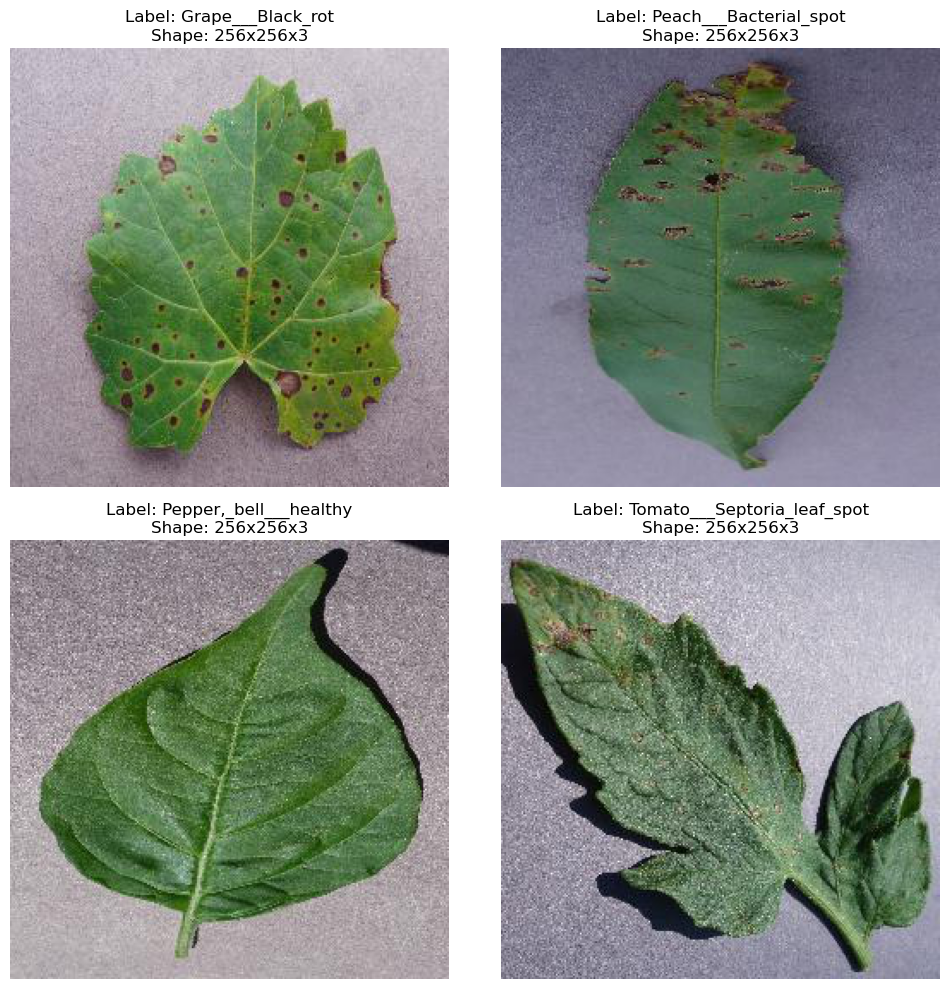

In [7]:
# Test display 4 RANDOM images
random.seed(33) # change the seed for new images
# choose 4 training images' paths randomly
image_path_list = list(Path(train_dir).rglob('*/*.jpg'))
random_image_paths = random.sample(image_path_list, 4)

# define the subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

# display the images randomly
for i, ax in enumerate(axes.flat):
    random_image_path = random_image_paths[i] # get image path
    image_class = random_image_path.parent.stem # get image class from path name as label
    image = Image.open(random_image_path) # open image
    ax.imshow(image) # display image on subplot
    
    # add label and shape of image
    ax.set_title(f"Label: {image_class}\nShape: {image.height}x{image.width}x{3 if image.mode == 'RGB' else 1}")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [8]:
class_names = train_ds.class_names
print(class_names)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

In [9]:
num_classes = 38

model = tf.keras.Sequential([
  tf.keras.layers.Rescaling(1./255),
    
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
    
  tf.keras.layers.MaxPooling2D(),
    
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
    
  tf.keras.layers.MaxPooling2D(),
    
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
    
  tf.keras.layers.MaxPooling2D(),
    
  tf.keras.layers.Flatten(),
    
  tf.keras.layers.Dense(128, activation='relu'),
    
  tf.keras.layers.Dense(num_classes)
])


In [ ]:
model.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

In [ ]:
# WARNING THIS STEP TAKES ~1 hour
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=5
)

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

In [ ]:
# create plot function for display result of training process
# figure out how many epochs there were
epochs = range(len(loss))
save="graph.jpg"

# setup a plot
plt.figure(figsize=(12, 4))

# plot loss
plt.subplot(1, 2, 1)
plt.plot(epochs, loss, label="train_loss")
plt.plot(epochs, val_loss, label="val_loss")
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend()

# plot accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, acc, label="train_accuracy")
plt.plot(epochs, val_acc, label="val_accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend()
    
# save graph
plt.savefig(save)

plt.show()

In [ ]:
# Save the model
model.save('my_model.keras')

In [32]:
# load the trained model
new_model = tf.keras.models.load_model('my_model.keras')

# define class labels
class_labels = train_ds.class_names

# Show the model architecture
new_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)                │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 254, 254, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 127, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 125, 125, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 60, 60, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 28800)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │       3,686,528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 38)                  │           4,902 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,132,468 (42.47 MB)

 Trainable params: 3,710,822 (14.16 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,421,646 (28.31 MB)

In [24]:
name_id_map = dict(zip(range(len(class_labels)), class_labels))
print(name_id_map)

{0: 'Apple___Apple_scab', 1: 'Apple___Black_rot', 2: 'Apple___Cedar_apple_rust', 3: 'Apple___healthy', 4: 'Blueberry___healthy', 5: 'Cherry_(including_sour)___Powdery_mildew', 6: 'Cherry_(including_sour)___healthy', 7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 8: 'Corn_(maize)___Common_rust_', 9: 'Corn_(maize)___Northern_Leaf_Blight', 10: 'Corn_(maize)___healthy', 11: 'Grape___Black_rot', 12: 'Grape___Esca_(Black_Measles)', 13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 14: 'Grape___healthy', 15: 'Orange___Haunglongbing_(Citrus_greening)', 16: 'Peach___Bacterial_spot', 17: 'Peach___healthy', 18: 'Pepper,_bell___Bacterial_spot', 19: 'Pepper,_bell___healthy', 20: 'Potato___Early_blight', 21: 'Potato___Late_blight', 22: 'Potato___healthy', 23: 'Raspberry___healthy', 24: 'Soybean___healthy', 25: 'Squash___Powdery_mildew', 26: 'Strawberry___Leaf_scorch', 27: 'Strawberry___healthy', 28: 'Tomato___Bacterial_spot', 29: 'Tomato___Early_blight', 30: 'Tomato___Late_blight', 31: 'To

In [25]:
test_data_dir = "..\\Project 4 Resources\\test"
jpg_test_files = list(Path(test_data_dir).rglob('*/*.jpg'))
len(jpg_test_files) #33

33

In [68]:
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_data_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

test_dir = Path(os.path.join(test_data_dir, "test"))

Found 33 files belonging to 1 classes.


In [65]:
treatments_df = pd.read_csv('plant_disease_treatments.csv')
treatments_df.insert(0, 'New_ID', range(0, 0 + len(treatments_df)))
treatments_df.head()

,New_ID,Plant Type,Disease,Treatment
0,0,Apple,Apple Scab,"For treating Apple Scab, apply fungicides such..."
1,1,Apple,Black Rot,"For treating Black Rot on apples, remove and d..."
2,2,Apple,cedar Apple rust,"For Cedar Apple Rust, remove nearby cedar tree..."
3,3,Apple,Healthy,Healthy plant. No treatment necessary!
4,4,Blueberry,Healthy,Healthy plant. No treatment necessary!


In [59]:
treatments_df.loc[treatments_df.New_ID.eq(3), 'Treatment'].values[0]

'Healthy plant. No treatment necessary!'

In [103]:
# prediction function on single image
def predict_image(image_path, model):
    # open and preprocess the image
    img = tf.keras.utils.load_img(image_path, target_size=(img_height, img_width))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions = model.predict(img_array)
    im_class = tf.argmax(predictions[0], axis=-1)
    class_title = name_id_map.get(int(im_class))
    treatment = treatments_df.loc[treatments_df.New_ID.eq(int(im_class)), 'Treatment'].values[0]

    # display the image with prediction and confidence
    plt.imshow(np.squeeze(img_array.numpy().astype("uint8")))
    plt.title(f"Class Predicted: {class_title}")
    plt.axis("off")
    plt.show()
    
    print(treatment)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


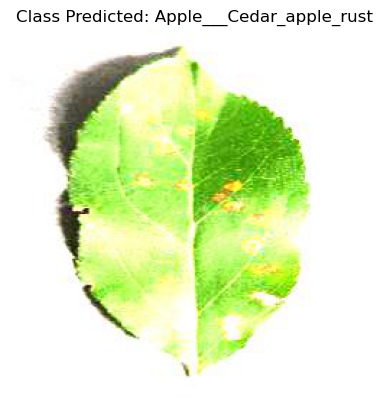

For Cedar Apple Rust, remove nearby cedar trees if possible to disrupt the disease cycle. Apply fungicidal sprays containing myclobutanil or ferbam early in the spring just before bud break and repeat during rainy periods to protect new growth.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


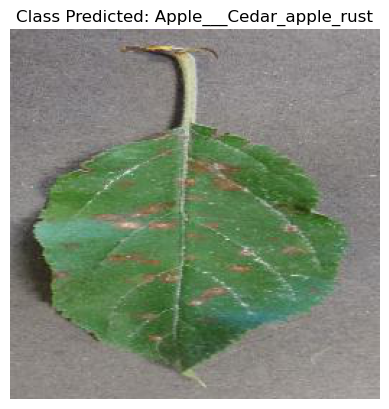

For Cedar Apple Rust, remove nearby cedar trees if possible to disrupt the disease cycle. Apply fungicidal sprays containing myclobutanil or ferbam early in the spring just before bud break and repeat during rainy periods to protect new growth.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


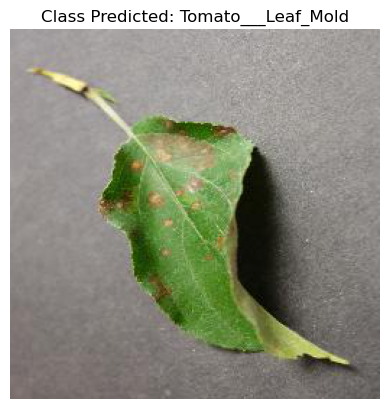

For Leaf Mold in tomatoes, apply fungicides that contain chlorothalonil or mancozeb, especially in greenhouse settings where the disease thrives. Improving air circulation by spacing the plants properly and using fans in greenhouses can also help prevent the disease.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


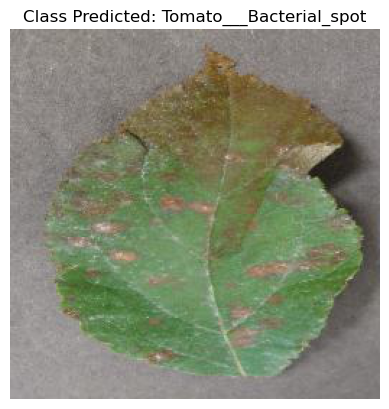

For Bacterial Spot on tomatoes, apply copper-based fungicides and consider tank-mixing with mancozeb for enhanced efficacy. Ensure that you also practice good sanitation by removing infected plants and debris and using drip irrigation to minimize leaf moisture.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


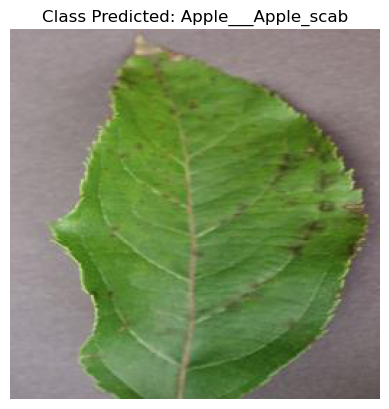

For treating Apple Scab, apply fungicides such as captan or myclobutanil early in the season during bud break and continue as necessary to protect new growth. Regular pruning to improve air circulation also helps reduce the incidence of the disease.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


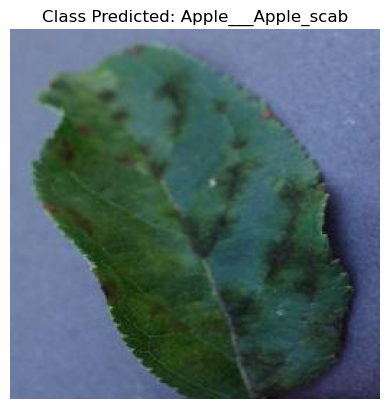

For treating Apple Scab, apply fungicides such as captan or myclobutanil early in the season during bud break and continue as necessary to protect new growth. Regular pruning to improve air circulation also helps reduce the incidence of the disease.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


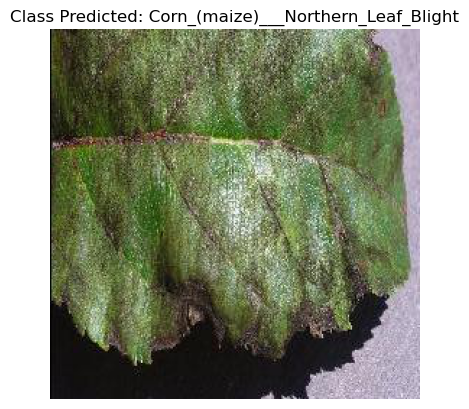

For Northern Leaf Blight on corn, apply a fungicide that contains propiconazole, pyraclostrobin, or a similar active ingredient as soon as symptoms appear. It's also beneficial to rotate crops and manage residue to reduce spore survival between seasons.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


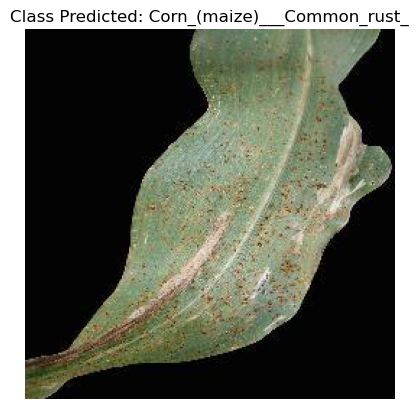

For Common Rust on corn, apply a fungicide containing tebuconazole or pyraclostrobin at the first sign of the disease. Ensure to rotate fungicides to prevent resistance and follow label directions for reapplication intervals.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


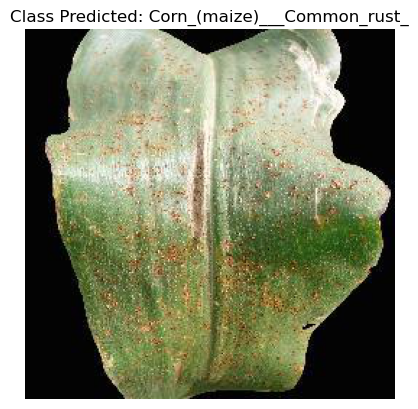

For Common Rust on corn, apply a fungicide containing tebuconazole or pyraclostrobin at the first sign of the disease. Ensure to rotate fungicides to prevent resistance and follow label directions for reapplication intervals.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


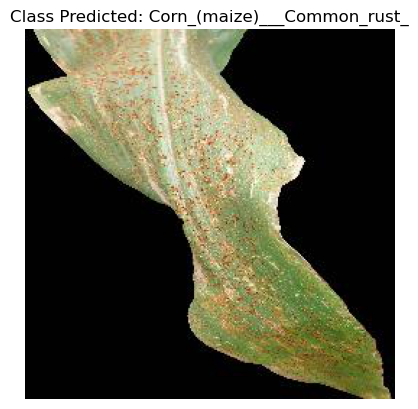

For Common Rust on corn, apply a fungicide containing tebuconazole or pyraclostrobin at the first sign of the disease. Ensure to rotate fungicides to prevent resistance and follow label directions for reapplication intervals.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


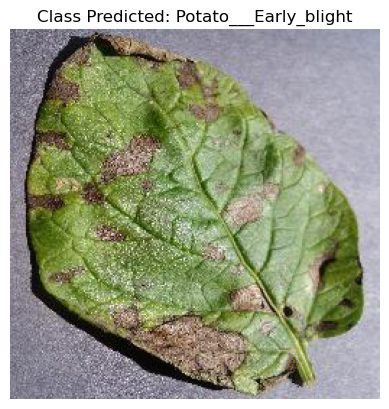

For Early Blight in potatoes, apply a fungicide that contains chlorothalonil or mancozeb as soon as symptoms are noticed and continue applications at regular intervals during the growing season. Improve air circulation and reduce leaf wetness by spacing plants properly and using drip irrigation instead of overhead watering.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


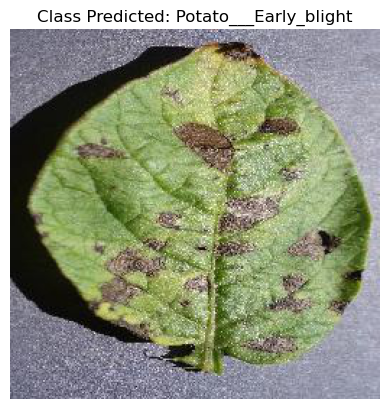

For Early Blight in potatoes, apply a fungicide that contains chlorothalonil or mancozeb as soon as symptoms are noticed and continue applications at regular intervals during the growing season. Improve air circulation and reduce leaf wetness by spacing plants properly and using drip irrigation instead of overhead watering.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


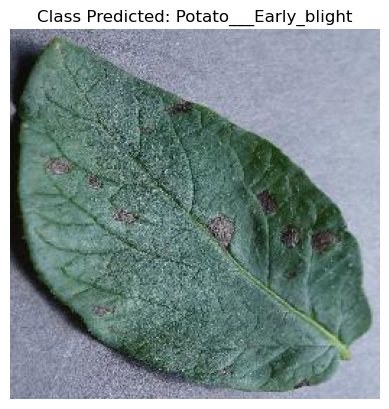

For Early Blight in potatoes, apply a fungicide that contains chlorothalonil or mancozeb as soon as symptoms are noticed and continue applications at regular intervals during the growing season. Improve air circulation and reduce leaf wetness by spacing plants properly and using drip irrigation instead of overhead watering.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


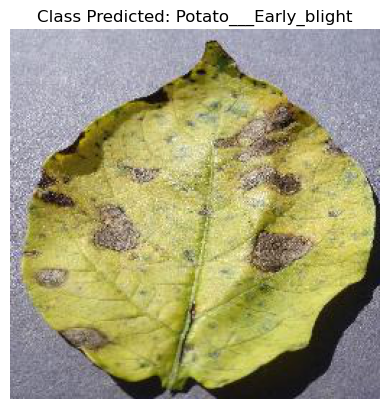

For Early Blight in potatoes, apply a fungicide that contains chlorothalonil or mancozeb as soon as symptoms are noticed and continue applications at regular intervals during the growing season. Improve air circulation and reduce leaf wetness by spacing plants properly and using drip irrigation instead of overhead watering.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


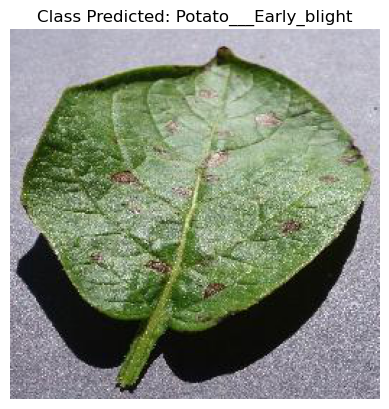

For Early Blight in potatoes, apply a fungicide that contains chlorothalonil or mancozeb as soon as symptoms are noticed and continue applications at regular intervals during the growing season. Improve air circulation and reduce leaf wetness by spacing plants properly and using drip irrigation instead of overhead watering.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


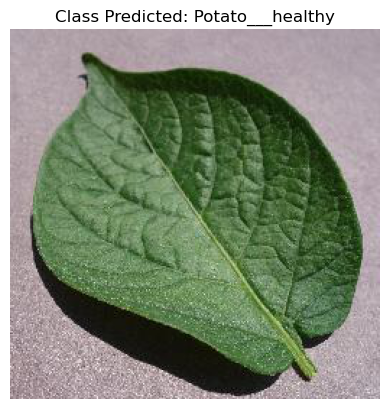

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


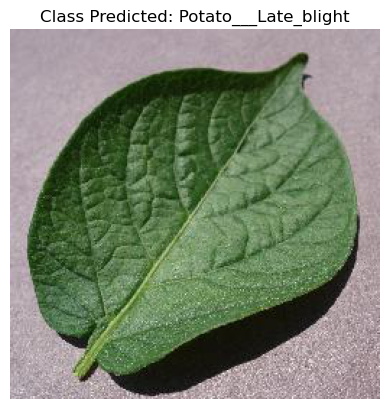

For Late Blight in potatoes, apply fungicides containing metalaxyl or chlorothalonil at the first sign of disease or forecasted wet, cool weather. Keep the foliage as dry as possible by using well-timed irrigation and ensuring good field drainage.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


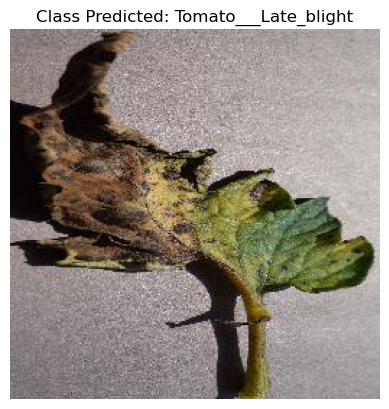

For Late Blight in tomatoes, apply fungicides containing metalaxyl or chlorothalonil at the first sign of the disease or before rainy weather. Also, try to improve air circulation around the plants and avoid overhead watering to reduce the humidity that the fungus thrives in.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


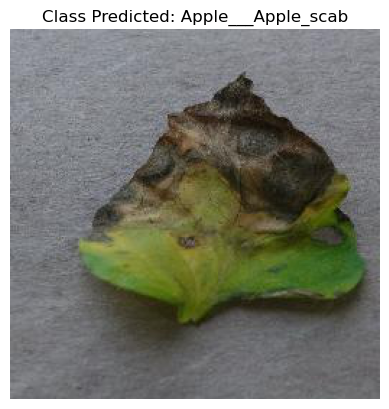

For treating Apple Scab, apply fungicides such as captan or myclobutanil early in the season during bud break and continue as necessary to protect new growth. Regular pruning to improve air circulation also helps reduce the incidence of the disease.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


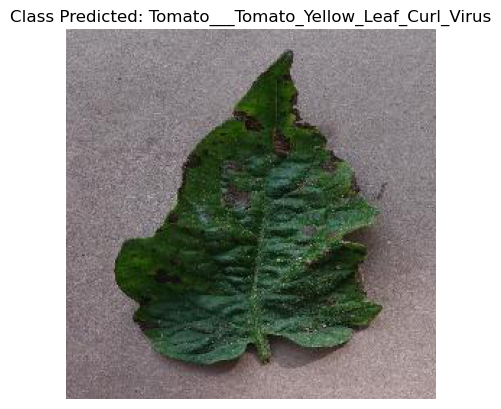

For Tomato Yellow Leaf Curl Virus, it's critical to manage the vector, the whitefly, using insecticides like imidacloprid or by introducing natural predators such as ladybugs. Additionally, remove and destroy infected plants immediately to prevent further spread of the virus.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


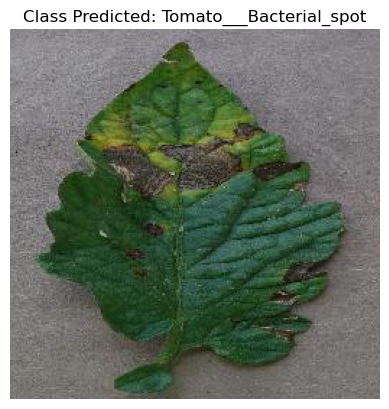

For Bacterial Spot on tomatoes, apply copper-based fungicides and consider tank-mixing with mancozeb for enhanced efficacy. Ensure that you also practice good sanitation by removing infected plants and debris and using drip irrigation to minimize leaf moisture.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


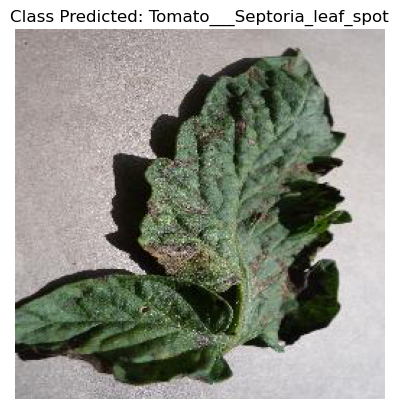

For Septoria Leaf Spot in tomatoes, apply fungicides such as mancozeb or chlorothalonil as soon as the first signs of spotting occur. It's also crucial to remove infected leaves, avoid overhead watering, and maintain good sanitation practices to minimize the spread of spores.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


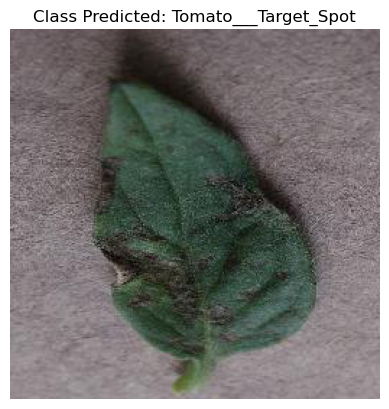

For managing Target Spot in tomatoes, apply fungicides containing chlorothalonil or mancozeb to protect plants during periods of high moisture and warm temperatures. Ensure good air circulation by proper spacing and practicing regular pruning to reduce humidity around the plants.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


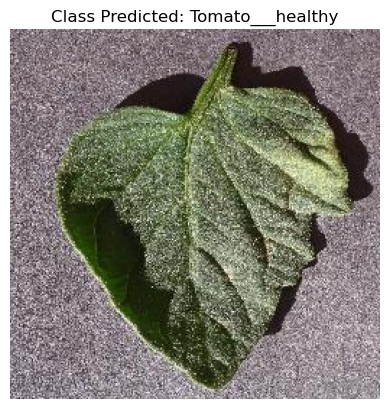

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


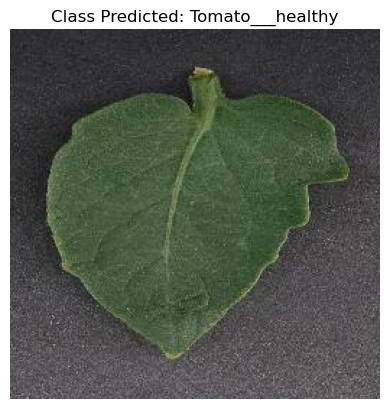

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


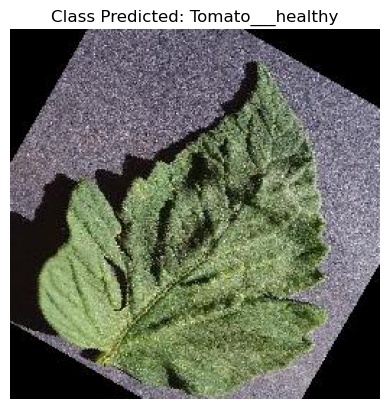

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


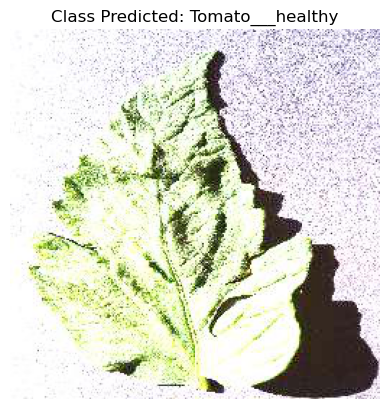

Healthy plant. No treatment necessary!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


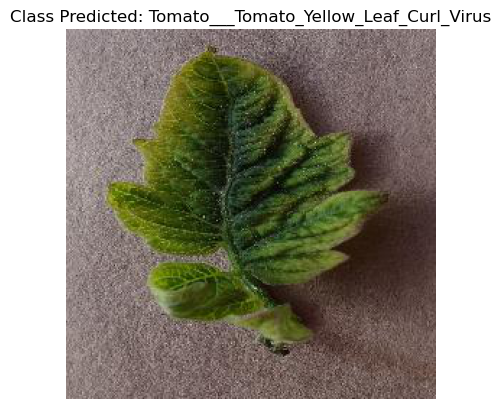

For Tomato Yellow Leaf Curl Virus, it's critical to manage the vector, the whitefly, using insecticides like imidacloprid or by introducing natural predators such as ladybugs. Additionally, remove and destroy infected plants immediately to prevent further spread of the virus.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


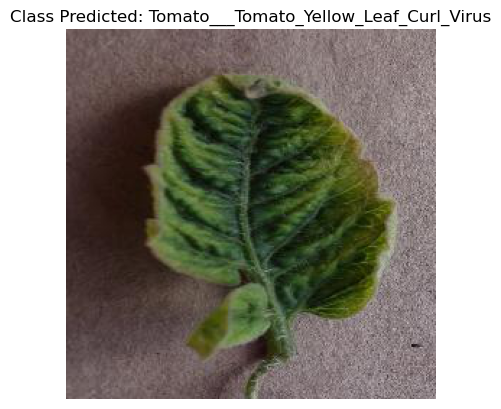

For Tomato Yellow Leaf Curl Virus, it's critical to manage the vector, the whitefly, using insecticides like imidacloprid or by introducing natural predators such as ladybugs. Additionally, remove and destroy infected plants immediately to prevent further spread of the virus.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


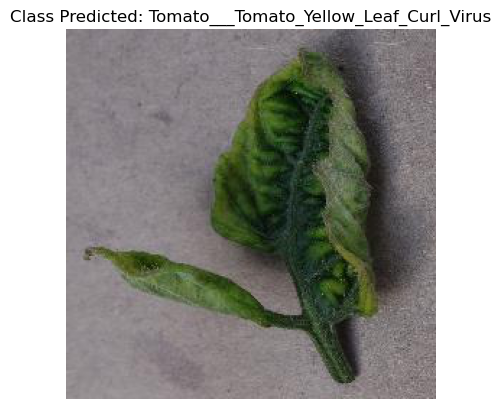

For Tomato Yellow Leaf Curl Virus, it's critical to manage the vector, the whitefly, using insecticides like imidacloprid or by introducing natural predators such as ladybugs. Additionally, remove and destroy infected plants immediately to prevent further spread of the virus.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


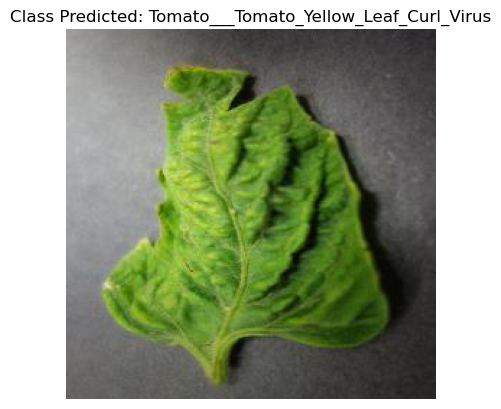

For Tomato Yellow Leaf Curl Virus, it's critical to manage the vector, the whitefly, using insecticides like imidacloprid or by introducing natural predators such as ladybugs. Additionally, remove and destroy infected plants immediately to prevent further spread of the virus.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


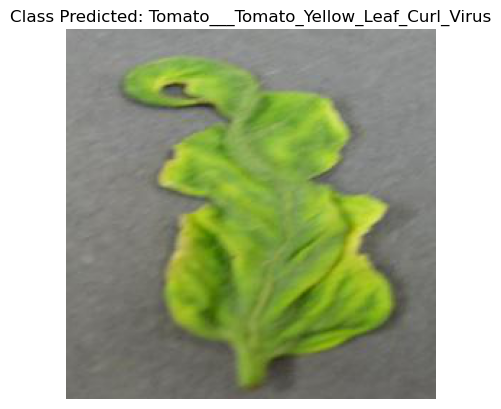

For Tomato Yellow Leaf Curl Virus, it's critical to manage the vector, the whitefly, using insecticides like imidacloprid or by introducing natural predators such as ladybugs. Additionally, remove and destroy infected plants immediately to prevent further spread of the virus.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


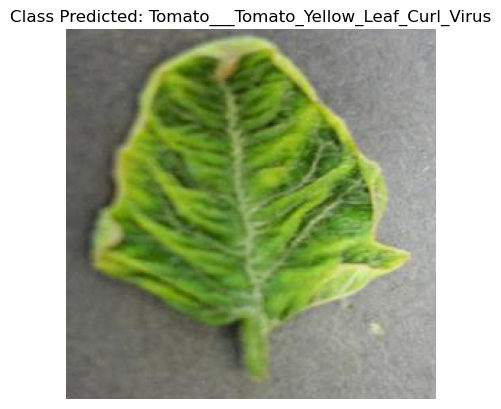

For Tomato Yellow Leaf Curl Virus, it's critical to manage the vector, the whitefly, using insecticides like imidacloprid or by introducing natural predators such as ladybugs. Additionally, remove and destroy infected plants immediately to prevent further spread of the virus.


In [102]:
# testing data predictions
for images in os.listdir(test_dir):
        predict_image((str(test_dir) + "\\" + images), new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


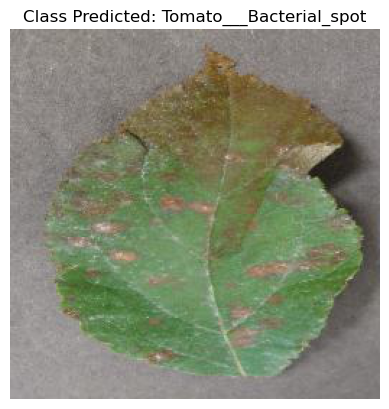

For Bacterial Spot on tomatoes, apply copper-based fungicides and consider tank-mixing with mancozeb for enhanced efficacy. Ensure that you also practice good sanitation by removing infected plants and debris and using drip irrigation to minimize leaf moisture.


In [97]:
# Prediction Testing 1 Image at a Time
# apple cedar rust prediction
image_path = "../Project 4 Resources/test/test/AppleCedarRust4.JPG"
predict_image(image_path, new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


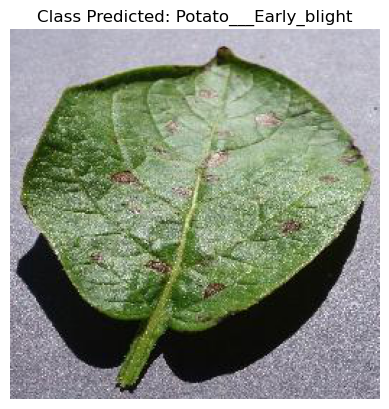

For Early Blight in potatoes, apply a fungicide that contains chlorothalonil or mancozeb as soon as symptoms are noticed and continue applications at regular intervals during the growing season. Improve air circulation and reduce leaf wetness by spacing plants properly and using drip irrigation instead of overhead watering.


In [98]:
# potato early blight prediction
image_path = "../Project 4 Resources/test/test/PotatoEarlyBlight5.JPG"
predict_image(image_path, new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


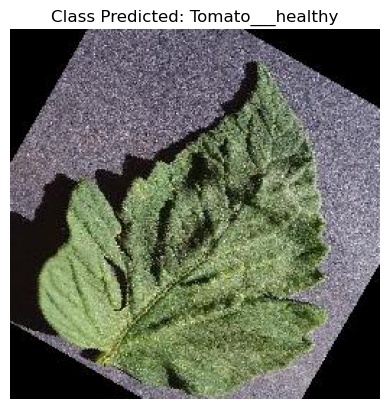

Healthy plant. No treatment necessary!


In [99]:
# healthy tomato prediction
image_path = "../Project 4 Resources/test/test/TomatoHealthy3.JPG"
predict_image(image_path, new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


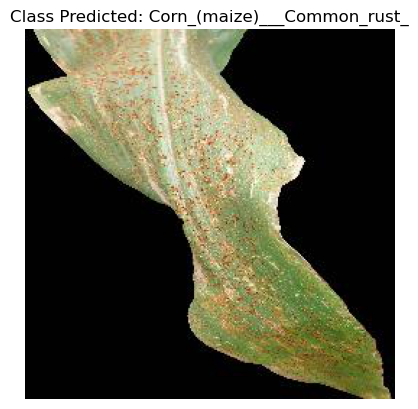

For Common Rust on corn, apply a fungicide containing tebuconazole or pyraclostrobin at the first sign of the disease. Ensure to rotate fungicides to prevent resistance and follow label directions for reapplication intervals.


In [100]:
# corn common rust prediction
image_path = "../Project 4 Resources/test/test/CornCommonRust3.JPG"
predict_image(image_path, new_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


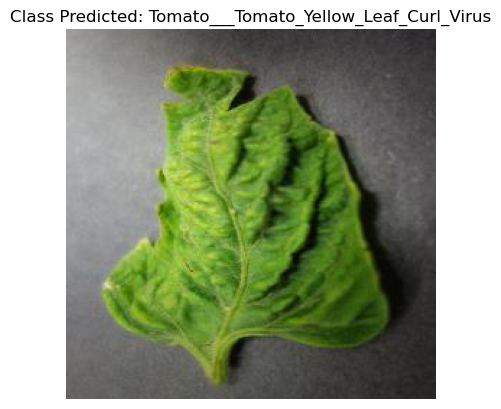

For Tomato Yellow Leaf Curl Virus, it's critical to manage the vector, the whitefly, using insecticides like imidacloprid or by introducing natural predators such as ladybugs. Additionally, remove and destroy infected plants immediately to prevent further spread of the virus.


In [101]:
# tomato yellow curl virus prediction
image_path = "../Project 4 Resources/test/test/TomatoYellowCurlVirus4.JPG"
predict_image(image_path, new_model)